# Construction Site Safety — PPE Detection with YOLOv8
**MSc AI for Architecture & Construction — M4U3 Assignment**

This notebook trains a YOLOv8n model to detect PPE on construction sites.

**Classes (10):** Hardhat, Mask, NO-Hardhat, NO-Mask, NO-Safety Vest, Person, Safety Cone, Safety Vest, machinery, vehicle

---

**Local Hardware:** NVIDIA RTX 4070 — full training takes ~10–15 min for 30 epochs.
**Colab Evaluation:** `LOAD_PRETRAINED` is set to `True` by default. The notebook will automatically download the 30-epoch weights from the GitHub Release and run inference.

## 1 — Install Dependencies

In [11]:
# Uncomment to install (first run only)
!pip install ultralytics==8.3.50 kagglehub

import ultralytics
print(f"Ultralytics version: {ultralytics.__version__}")
ultralytics.checks()

Ultralytics 8.3.50  Python-3.11.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Setup complete  (16 CPUs, 63.3 GB RAM, 560.7/951.6 GB disk)


## 2 — Download Dataset

**Source:** [Construction Site Safety Image Dataset](https://www.kaggle.com/datasets/snehilsanyal/construction-site-safety-image-dataset-roboflow)  
2801 images in YOLOv8 format · Train: 2605 / Valid: 114 / Test: 82

In [12]:
import kagglehub
import os
import glob

# Downloads once, then uses cache
DATASET_DIR = kagglehub.dataset_download(
    "snehilsanyal/construction-site-safety-image-dataset-roboflow"
)
print(f"Dataset path: {DATASET_DIR}")

# Auto-detect the root containing train/valid
DATA_ROOT = DATASET_DIR
for root, dirs, _ in os.walk(DATASET_DIR):
    if 'train' in dirs and ('valid' in dirs or 'val' in dirs):
        DATA_ROOT = root
        break

valid_folder = 'valid' if os.path.exists(os.path.join(DATA_ROOT, 'valid')) else 'val'
test_folder_exists = os.path.exists(os.path.join(DATA_ROOT, 'test'))

print(f"\nData root: {DATA_ROOT}")
print(f"Train images: {len(glob.glob(os.path.join(DATA_ROOT, 'train/images/*')))}")
print(f"Valid images: {len(glob.glob(os.path.join(DATA_ROOT, f'{valid_folder}/images/*')))}")
if test_folder_exists:
    print(f"Test images:  {len(glob.glob(os.path.join(DATA_ROOT, 'test/images/*')))}")

Dataset path: C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3

Data root: C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data
Train images: 2605
Valid images: 114
Test images:  82


## 3 — Create data.yaml

In [15]:
yaml_content = f"""path: {DATA_ROOT}
train: train/images
val: {valid_folder}/images
{f'test: test/images' if test_folder_exists else ''}

names:
  0: Hardhat
  1: Mask
  2: NO-Hardhat
  3: NO-Mask
  4: NO-Safety Vest
  5: Person
  6: Safety Cone
  7: Safety Vest
  8: machinery
  9: vehicle
"""

DATA_YAML = os.path.join(DATA_ROOT, 'data.yaml')
with open(DATA_YAML, 'w') as f:
    f.write(yaml_content)

print(f"data.yaml → {DATA_YAML}")
print(yaml_content)

data.yaml → C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\data.yaml
path: C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data
train: train/images
val: valid/images
test: test/images

names:
  0: Hardhat
  1: Mask
  2: NO-Hardhat
  3: NO-Mask
  4: NO-Safety Vest
  5: Person
  6: Safety Cone
  7: Safety Vest
  8: machinery
  9: vehicle



## 4 — Visualize Sample Annotations

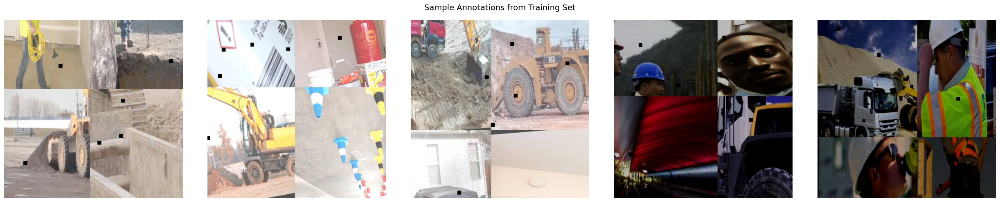

Saved → annotation_samples.png


In [16]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

CLASS_NAMES = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest',
               'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
COLORS = plt.cm.tab10(np.linspace(0, 1, len(CLASS_NAMES)))

def draw_yolo_labels(img_path, label_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls_id = int(parts[0])
                cx, cy, bw, bh = [float(x) for x in parts[1:5]]
                x1, y1 = int((cx - bw/2) * w), int((cy - bh/2) * h)
                x2, y2 = int((cx + bw/2) * w), int((cy + bh/2) * h)
                color = tuple(int(c*255) for c in COLORS[cls_id][:3])
                cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
                cv2.putText(img, CLASS_NAMES[cls_id], (x1, y1-5),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img

train_imgs = glob.glob(os.path.join(DATA_ROOT, 'train/images/*'))
samples = random.sample(train_imgs, min(5, len(train_imgs)))

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for ax, img_path in zip(axes, samples):
    # Handle both / and \\ path separators
    label_path = img_path.replace(os.sep + 'images' + os.sep, os.sep + 'labels' + os.sep)
    label_path = os.path.splitext(label_path)[0] + '.txt'
    img = draw_yolo_labels(img_path, label_path)
    ax.imshow(img)
    ax.axis('off')
plt.suptitle('Sample Annotations from Training Set', fontsize=14)
plt.tight_layout()
plt.savefig('annotation_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → annotation_samples.png")

## 5 — Configuration

In [22]:
from ultralytics import YOLO
import os
import urllib.request
import urllib.error

# ============ EDIT HERE ============
LOAD_PRETRAINED = True               # True → skip training, load weights
WEIGHTS_PATH = '_downloaded_models/best.pt'  # Saved to a local-only folder

EPOCHS = 30
BATCH = 16
IMGSZ = 640
MODEL_VARIANT = 'yolov8n.pt'

PROJECT_DIR = 'runs'
RUN_NAME = 'ppe_detection'
# ===================================

"""## 5.5 — Download Pre-trained Weights"""

if LOAD_PRETRAINED and not os.path.exists(WEIGHTS_PATH):
    print(f"Pre-trained weights not found at {WEIGHTS_PATH}. Downloading from GitHub...")

    # 1. Explicitly check if the folder exists, and create it if it doesn't
    folder_name = os.path.dirname(WEIGHTS_PATH)
    if not os.path.exists(folder_name):
        os.makedirs(folder_name)
        print(f"Created new folder: ./{folder_name}/")

    # 2. Download the file
    github_url = "https://github.com/CarloCogni/computer-vision-with-YOLO/releases/download/V1.0/best.pt"

    try:
        urllib.request.urlretrieve(github_url, WEIGHTS_PATH)
        print(f"Download complete! Saved to {WEIGHTS_PATH}")
    except urllib.error.URLError as e:
        print(f"Failed to download weights. Error: {e}")
        print("Falling back to training...")
        LOAD_PRETRAINED = False
elif LOAD_PRETRAINED:
    print(f"Weights already exist at {WEIGHTS_PATH}. Ready for inference!")

Weights already exist at _downloaded_models/best.pt. Ready for inference!


## 6 — Train YOLOv8n (30 epochs)

In [6]:
if LOAD_PRETRAINED:
    model = YOLO(WEIGHTS_PATH)
    print(f"Loaded weights: {WEIGHTS_PATH}")
else:
    model = YOLO(MODEL_VARIANT)
    results = model.train(
        data=DATA_YAML,
        epochs=EPOCHS,
        batch=BATCH,
        imgsz=IMGSZ,
        project=PROJECT_DIR,
        name=RUN_NAME,
        exist_ok=True,
        plots=True,
        save=True,
        verbose=True
    )
    print("\n Training complete!")

BEST_WEIGHTS = WEIGHTS_PATH if LOAD_PRETRAINED else os.path.join(PROJECT_DIR, RUN_NAME, 'weights', 'best.pt')
model = YOLO(BEST_WEIGHTS)
print(f"Model loaded: {BEST_WEIGHTS}")

Ultralytics 8.3.50  Python-3.11.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs, name=ppe_detection, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

train: Scanning C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\train\labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING  C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\train\images\004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING  C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\train\images\construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed



val: Scanning C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\valid\labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs\ppe_detection\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\ppe_detection
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.18G      1.388      2.794      1.492        269        640: 100%|██████████| 163/163 [00:21<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all        114        697      0.549      0.372      0.396      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      3.67G       1.29      1.818      1.438        264        640: 100%|██████████| 163/163 [00:19<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.48it/s]

                   all        114        697      0.556      0.389      0.414      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      3.47G       1.24      1.649        1.4        250        640: 100%|██████████| 163/163 [00:19<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.57it/s]

                   all        114        697       0.61      0.463      0.493      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.31G      1.227      1.577      1.384        297        640: 100%|██████████| 163/163 [00:19<00:00,  8.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.21it/s]

                   all        114        697      0.584      0.518      0.527       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      3.46G       1.19      1.462      1.352        262        640: 100%|██████████| 163/163 [00:19<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]

                   all        114        697      0.742      0.502      0.581      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.72G      1.176      1.424       1.34        294        640: 100%|██████████| 163/163 [00:19<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.63it/s]

                   all        114        697      0.748      0.575      0.618      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      3.34G      1.141      1.349      1.315        283        640: 100%|██████████| 163/163 [00:19<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.88it/s]

                   all        114        697      0.721      0.566      0.622      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      3.25G       1.12      1.296      1.303        238        640: 100%|██████████| 163/163 [00:19<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.84it/s]

                   all        114        697      0.745      0.554      0.606      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      3.16G      1.114       1.25       1.29        300        640: 100%|██████████| 163/163 [00:19<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.85it/s]

                   all        114        697      0.775      0.581      0.646      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.33G      1.103      1.217      1.285        305        640: 100%|██████████| 163/163 [00:19<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.87it/s]

                   all        114        697      0.752      0.519      0.598       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.49G       1.08      1.194      1.272        217        640: 100%|██████████| 163/163 [00:19<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]

                   all        114        697      0.821      0.528      0.612      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      3.27G       1.07       1.16      1.259        447        640: 100%|██████████| 163/163 [00:19<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.73it/s]

                   all        114        697      0.814      0.576      0.658      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.01G      1.064      1.125      1.254        232        640: 100%|██████████| 163/163 [00:19<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.94it/s]

                   all        114        697      0.811      0.598      0.674      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      3.79G      1.056      1.115      1.245        249        640: 100%|██████████| 163/163 [00:19<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.68it/s]

                   all        114        697      0.758      0.624      0.672      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      3.73G      1.036       1.08      1.236        222        640: 100%|██████████| 163/163 [00:19<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]

                   all        114        697      0.766       0.64      0.685      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.83G      1.019      1.057      1.224        381        640: 100%|██████████| 163/163 [00:19<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]

                   all        114        697      0.775      0.621      0.688      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.83G      1.021      1.035      1.219        428        640: 100%|██████████| 163/163 [00:19<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.76it/s]

                   all        114        697       0.77      0.625       0.68      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       2.7G      1.003      1.016      1.214        257        640: 100%|██████████| 163/163 [00:19<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.93it/s]

                   all        114        697       0.77      0.633      0.686      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      3.35G     0.9996     0.9953      1.201        279        640: 100%|██████████| 163/163 [00:19<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.92it/s]

                   all        114        697      0.844      0.622      0.715      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.79G     0.9838     0.9778        1.2        223        640: 100%|██████████| 163/163 [00:19<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.87it/s]

                   all        114        697      0.833      0.634      0.707      0.392


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.81G       1.02     0.9286      1.218        206        640: 100%|██████████| 163/163 [00:18<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.01it/s]

                   all        114        697      0.825      0.653      0.716      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.86G     0.9974     0.8774      1.201        219        640: 100%|██████████| 163/163 [00:18<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.87it/s]

                   all        114        697      0.853      0.646      0.719        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       2.7G     0.9858     0.8542      1.194        187        640: 100%|██████████| 163/163 [00:18<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.67it/s]

                   all        114        697      0.869      0.664      0.738      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       2.5G     0.9685     0.8352      1.189        147        640: 100%|██████████| 163/163 [00:18<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]

                   all        114        697      0.856      0.656      0.729      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.77G     0.9552     0.8178      1.177        144        640: 100%|██████████| 163/163 [00:18<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.58it/s]

                   all        114        697      0.834       0.68       0.74      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.07G     0.9446      0.794      1.165        140        640: 100%|██████████| 163/163 [00:18<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]

                   all        114        697      0.869      0.676      0.753      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.59G      0.928     0.7843      1.157        191        640: 100%|██████████| 163/163 [00:18<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.02it/s]

                   all        114        697      0.896      0.665      0.755       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.65G     0.9197     0.7671      1.156        159        640: 100%|██████████| 163/163 [00:18<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.74it/s]

                   all        114        697      0.886      0.676      0.753      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.54G     0.9066     0.7546      1.148        175        640: 100%|██████████| 163/163 [00:18<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.92it/s]

                   all        114        697      0.876      0.677      0.753      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.67G     0.9026     0.7455      1.142        210        640: 100%|██████████| 163/163 [00:18<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.89it/s]

                   all        114        697      0.878      0.674      0.748      0.436



30 epochs completed in 0.176 hours.
Optimizer stripped from runs\ppe_detection\weights\last.pt, 6.2MB
Optimizer stripped from runs\ppe_detection\weights\best.pt, 6.2MB

Validating runs\ppe_detection\weights\best.pt...
Ultralytics 8.3.50  Python-3.11.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.56it/s]


                   all        114        697      0.874      0.678      0.754      0.441
               Hardhat         42         79      0.961      0.709      0.841      0.535
                  Mask         19         21      0.911       0.81      0.856      0.595
            NO-Hardhat         37         69       0.95      0.554      0.668      0.325
               NO-Mask         44         74      0.893      0.473      0.553      0.262
        NO-Safety Vest         56        106      0.907      0.642      0.764      0.418
                Person         84        166      0.855      0.711      0.798      0.463
           Safety Cone         13         44      0.861      0.864      0.864      0.478
           Safety Vest         28         41      0.847      0.707      0.806       0.47
             machinery         26         55       0.86      0.855       0.91      0.586
               vehicle         16         42      0.699      0.452      0.478      0.278
Speed: 0.3ms preproce

## 7 — Training Curves


--- results.png ---


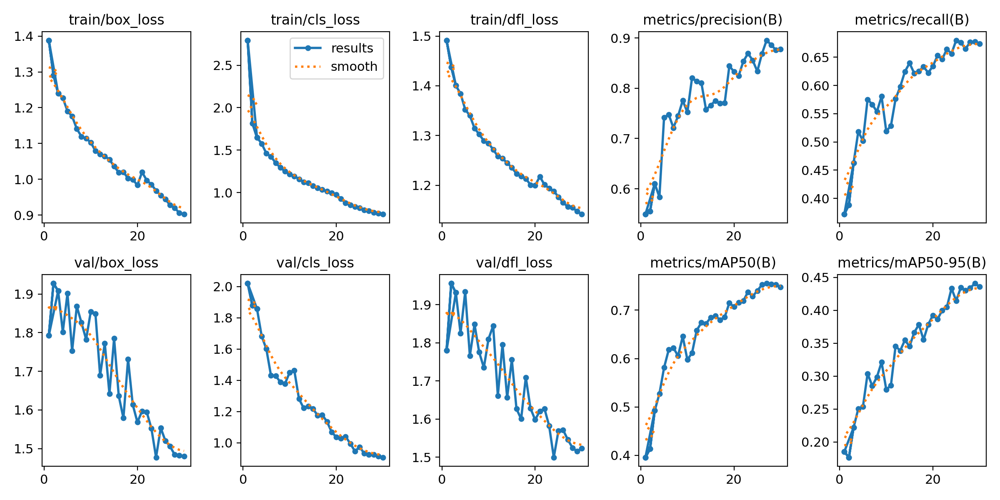


--- confusion_matrix.png ---


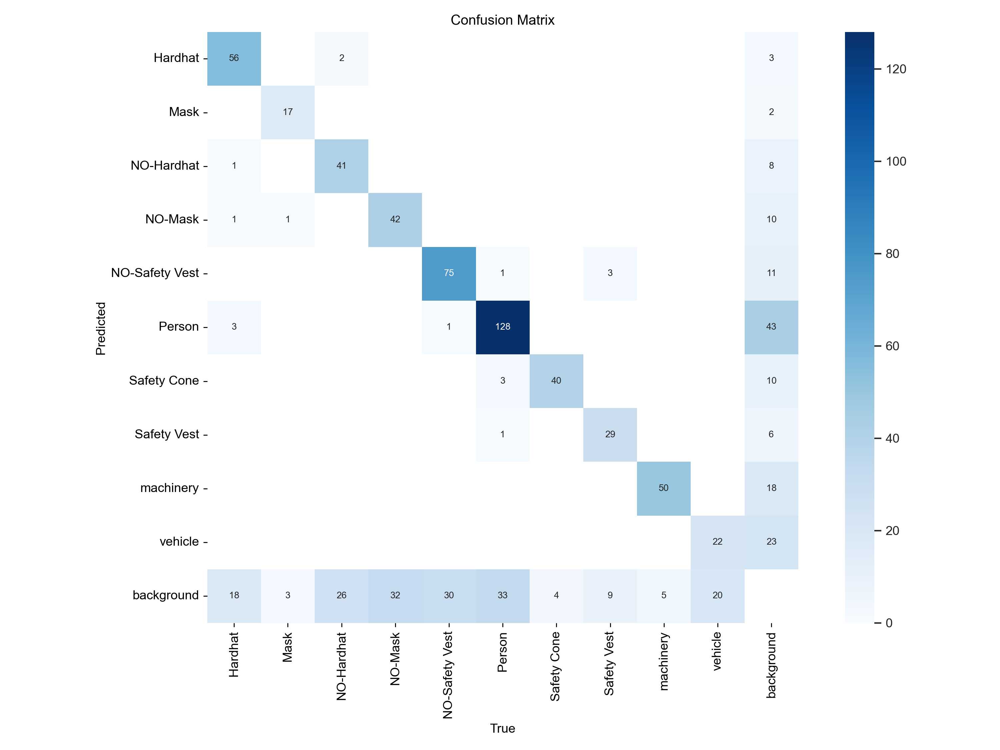


--- confusion_matrix_normalized.png ---


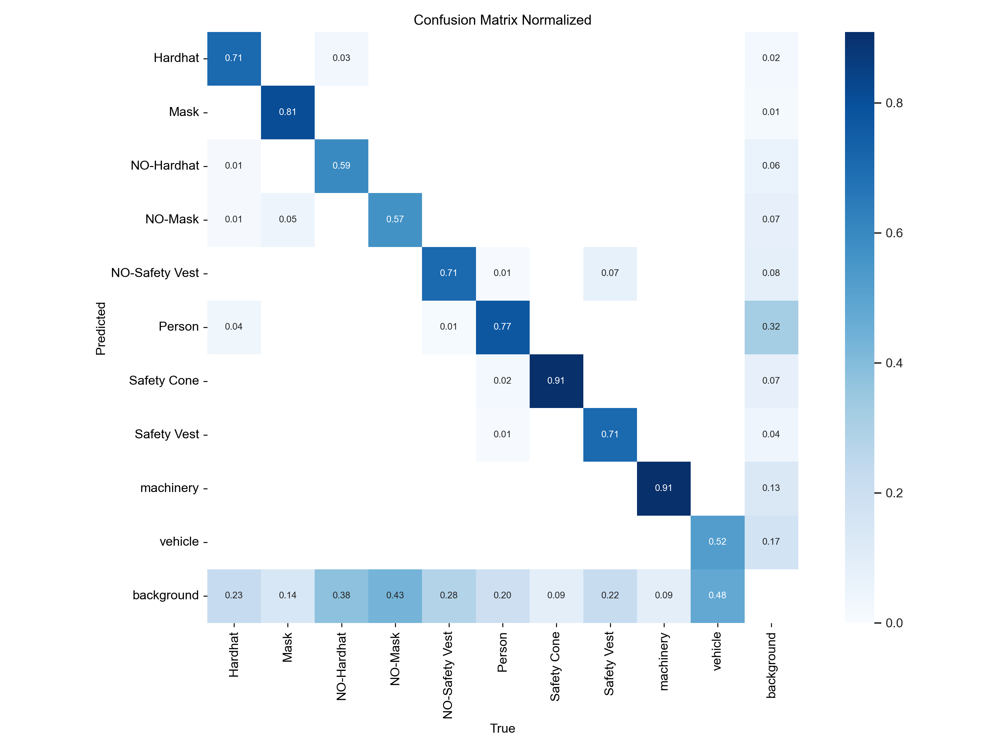


--- F1_curve.png ---


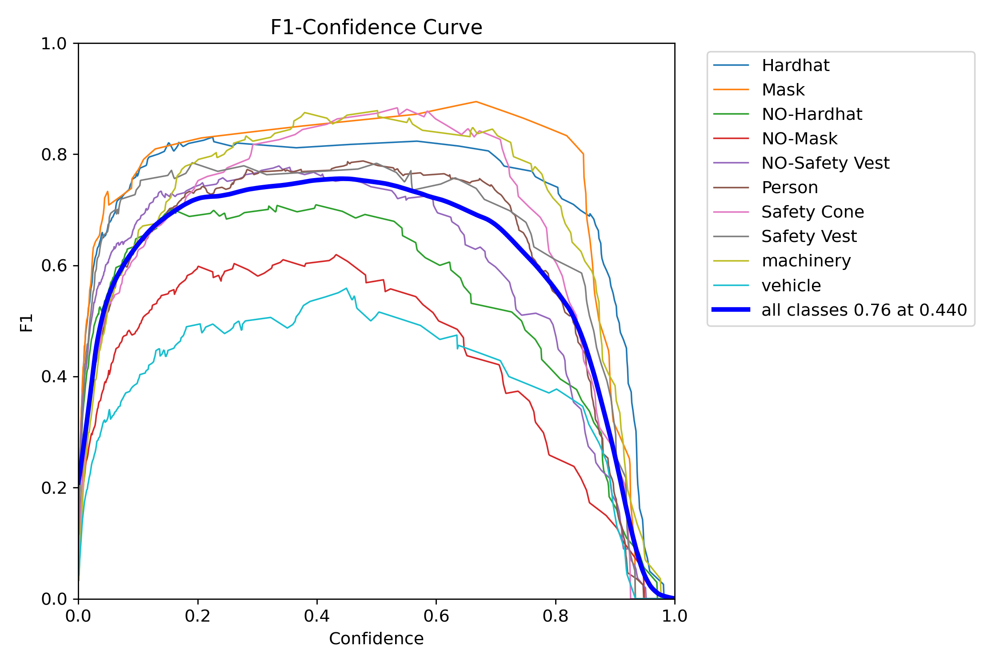


--- P_curve.png ---


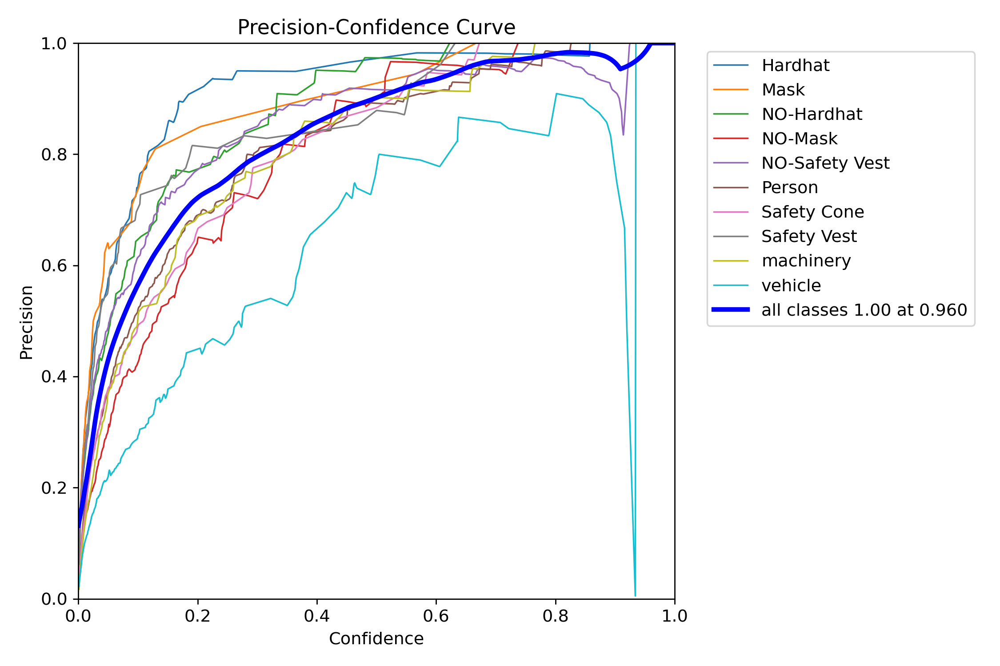


--- R_curve.png ---


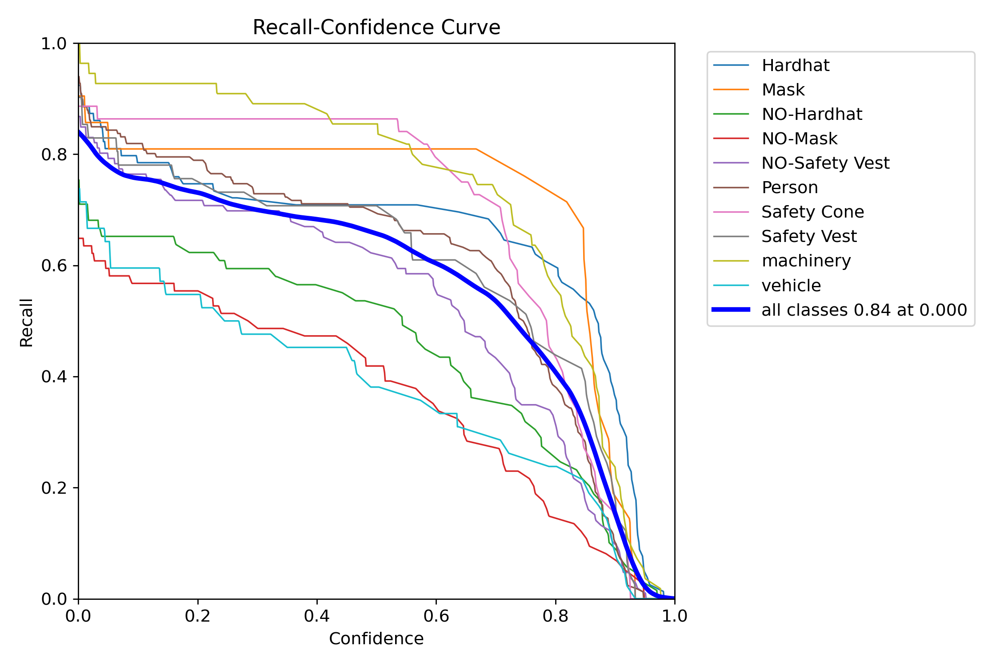


--- PR_curve.png ---


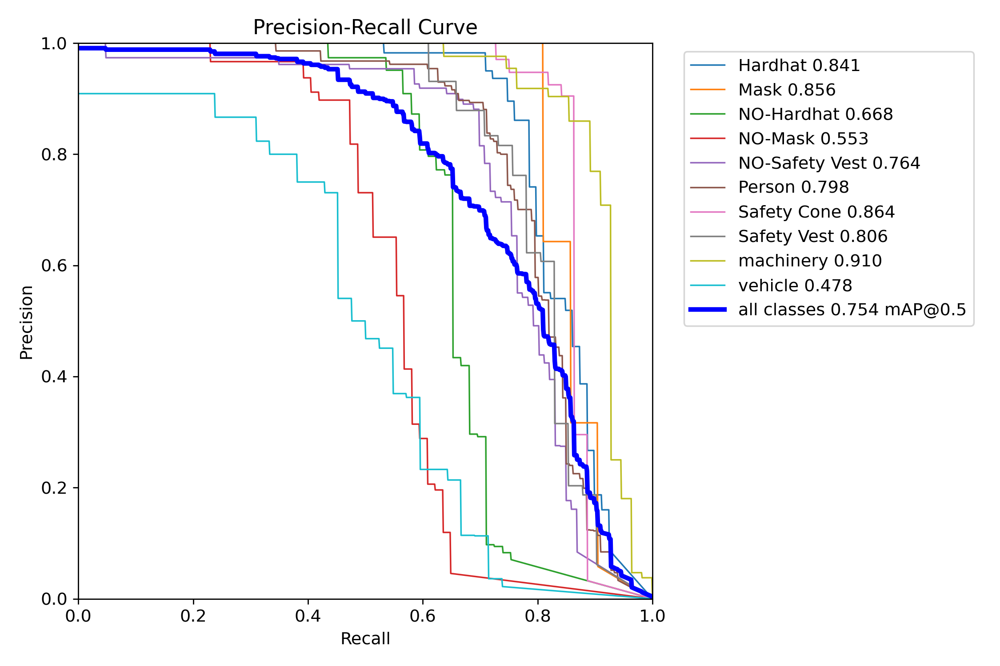

In [7]:
from IPython.display import Image as IPyImage, display

RESULTS_DIR = os.path.join(PROJECT_DIR, RUN_NAME)

curves = ['results.png', 'confusion_matrix.png', 'confusion_matrix_normalized.png',
          'F1_curve.png', 'P_curve.png', 'R_curve.png', 'PR_curve.png']

for curve in curves:
    path = os.path.join(RESULTS_DIR, curve)
    if os.path.exists(path):
        print(f"\n--- {curve} ---")
        display(IPyImage(filename=path, width=800))

## 8 — Validation Metrics

In [8]:
val_results = model.val(data=DATA_YAML, imgsz=IMGSZ)

print("\n" + "="*60)
print("VALIDATION RESULTS")
print("="*60)
print(f"Precision:    {val_results.box.mp:.4f}")
print(f"Recall:       {val_results.box.mr:.4f}")
print(f"mAP@50:       {val_results.box.map50:.4f}")
print(f"mAP@50-95:    {val_results.box.map:.4f}")
print("="*60)

print("\nPer-class AP@50:")
for i, name in enumerate(CLASS_NAMES):
    if i < len(val_results.box.ap50):
        print(f"  {name:20s}: {val_results.box.ap50[i]:.4f}")

Ultralytics 8.3.50  Python-3.11.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\carlo\.cache\kagglehub\datasets\snehilsanyal\construction-site-safety-image-dataset-roboflow\versions\3\css-data\valid\labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.66it/s]


                   all        114        697      0.876      0.677      0.753      0.441
               Hardhat         42         79      0.961      0.709      0.841       0.53
                  Mask         19         21      0.912       0.81      0.857      0.592
            NO-Hardhat         37         69       0.95      0.553      0.668      0.325
               NO-Mask         44         74      0.897      0.472      0.555      0.265
        NO-Safety Vest         56        106      0.907      0.642      0.766      0.417
                Person         84        166      0.862      0.711      0.799      0.463
           Safety Cone         13         44       0.86      0.864      0.859      0.476
           Safety Vest         28         41      0.847      0.707      0.808      0.472
             machinery         26         55      0.862      0.855      0.909       0.59
               vehicle         16         42        0.7      0.452      0.474      0.277
Speed: 1.2ms preproce

## 9 — Inference on Validation Images (10 samples)


0: 640x640 1 Hardhat, 1 NO-Mask, 1 Person, 1 Safety Vest, 3 machinerys, 3.7ms
1: 640x640 1 NO-Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 3.7ms
2: 640x640 (no detections), 3.7ms
3: 640x640 3 NO-Hardhats, 4 NO-Safety Vests, 11 Persons, 3.7ms
4: 640x640 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 3.7ms
5: 640x640 1 Hardhat, 1 NO-Safety Vest, 1 Person, 3.7ms
6: 640x640 1 Person, 2 machinerys, 3.7ms
7: 640x640 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 3.7ms
8: 640x640 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 3.7ms
9: 640x640 1 NO-Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 3.7ms
Speed: 1.0ms preprocess, 3.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\val_predictions


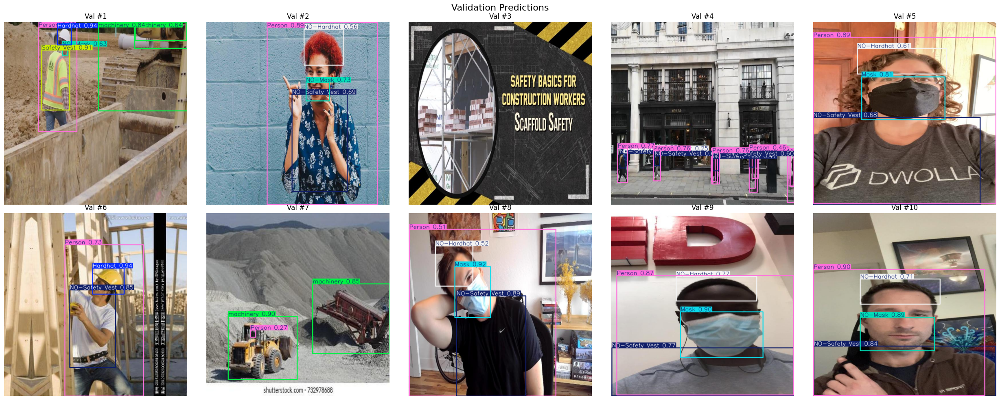

Saved → val_predictions_grid.png


In [9]:
val_imgs = glob.glob(os.path.join(DATA_ROOT, f'{valid_folder}/images/*'))
val_samples = random.sample(val_imgs, min(10, len(val_imgs)))

val_preds = model.predict(
    source=val_samples, imgsz=IMGSZ, conf=0.25,
    save=True, project=PROJECT_DIR, name='val_predictions', exist_ok=True
)

fig, axes = plt.subplots(2, 5, figsize=(25, 10))
for idx, (ax, result) in enumerate(zip(axes.flat, val_preds)):
    img = result.plot()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Val #{idx+1}')
plt.suptitle('Validation Predictions', fontsize=16)
plt.tight_layout()
plt.savefig('val_predictions_grid.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → val_predictions_grid.png")

## 10 — Inference on New/Test Images (5 samples)


0: 640x640 1 Hardhat, 1 Mask, 1 Person, 1 Safety Vest, 3.3ms
1: 640x640 1 Hardhat, 1 Person, 1 Safety Vest, 3.3ms
2: 640x640 21 Hardhats, 28 NO-Masks, 44 Persons, 23 Safety Vests, 1 machinery, 3.3ms
3: 640x640 (no detections), 3.3ms
4: 640x640 2 machinerys, 3.3ms
Speed: 1.5ms preprocess, 3.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\new_predictions


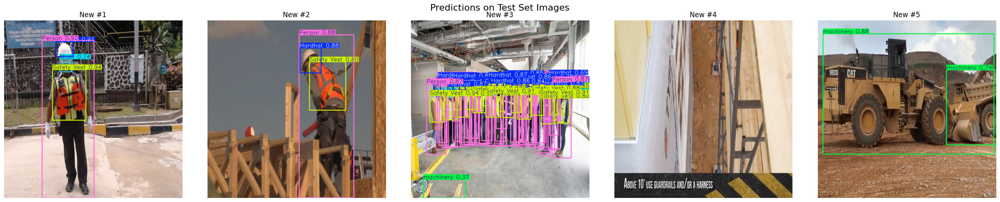

Saved → new_predictions_grid.png


In [10]:
if test_folder_exists:
    new_imgs = glob.glob(os.path.join(DATA_ROOT, 'test/images/*'))
    source_label = "Test Set"
else:
    used_set = set(val_samples)
    new_imgs = [p for p in val_imgs if p not in used_set]
    source_label = "Additional Validation"

new_samples = random.sample(new_imgs, min(5, len(new_imgs)))

new_preds = model.predict(
    source=new_samples, imgsz=IMGSZ, conf=0.25,
    save=True, project=PROJECT_DIR, name='new_predictions', exist_ok=True
)

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for idx, (ax, result) in enumerate(zip(axes, new_preds)):
    img = result.plot()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'New #{idx+1}')
plt.suptitle(f'Predictions on {source_label} Images', fontsize=16)
plt.tight_layout()
plt.savefig('new_predictions_grid.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → new_predictions_grid.png")

## 11 — SAM Exploration Notes

**What SAM could help with:**
- Precise segmentation masks for PPE items (beyond bounding boxes)
- Semi-automatic relabeling of imprecise bounding boxes
- Zero-shot segmentation of PPE in unseen construction photos

**Limitations observed:**
- Struggles with small objects (masks, distant cones)
- No class labels — only segments, still needs a classifier
- Too heavy for real-time site monitoring
- Overlapping PPE on same person creates ambiguous segments

## 12 — Environment Info

In [11]:
import torch
import platform
from datetime import datetime

print("="*60)
print("ENVIRONMENT INFO")
print("="*60)
print(f"Date/Time:       {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Python:          {platform.python_version()}")
print(f"PyTorch:         {torch.__version__}")
print(f"Ultralytics:     {ultralytics.__version__}")
print(f"CUDA available:  {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU:             {torch.cuda.get_device_name(0)}")
print(f"\nModel:           {MODEL_VARIANT}")
print(f"Epochs:          {EPOCHS}")
print(f"Batch size:      {BATCH}")
print(f"Image size:      {IMGSZ}")
print("="*60)

ENVIRONMENT INFO
Date/Time:       2026-02-20 10:39:27
Python:          3.11.9
PyTorch:         2.6.0+cu124
Ultralytics:     8.3.50
CUDA available:  True
GPU:             NVIDIA GeForce RTX 4070 Laptop GPU

Model:           yolov8n.pt
Epochs:          30
Batch size:      16
Image size:      640


*(Note: This cell is a utility script used by the author to extract training curves and images for the GitHub repository. It does not need to be run for evaluation purposes.)*

## 13 — Collect Results for Repo

In [12]:
import shutil

REPO_OUT = 'repo_results'
os.makedirs(f'{REPO_OUT}/curves', exist_ok=True)
os.makedirs(f'{REPO_OUT}/evidence', exist_ok=True)

# Training curves
for curve in curves:
    src = os.path.join(RESULTS_DIR, curve)
    if os.path.exists(src):
        shutil.copy(src, f'{REPO_OUT}/curves/{curve}')

# Prediction grids
for fname in ['annotation_samples.png', 'val_predictions_grid.png', 'new_predictions_grid.png']:
    if os.path.exists(fname):
        shutil.copy(fname, f'{REPO_OUT}/evidence/{fname}')

# Best weights
if os.path.exists(BEST_WEIGHTS):
    shutil.copy(BEST_WEIGHTS, f'{REPO_OUT}/best.pt')

print("Files for GitHub:")
for root, dirs, files in os.walk(REPO_OUT):
    for f in sorted(files):
        rel = os.path.join(root, f)
        size_mb = os.path.getsize(rel) / (1024*1024)
        print(f"  {rel}  ({size_mb:.1f} MB)")

print(f"\n→ Copy curves/* → results/curves/ in your repo")
print(f"→ Copy evidence/* → results/evidence/ in your repo")
print(f"→ Upload best.pt to GitHub Release or Google Drive")

Files for GitHub:
  repo_results\best.pt  (6.0 MB)
  repo_results\curves\F1_curve.png  (0.4 MB)
  repo_results\curves\PR_curve.png  (0.2 MB)
  repo_results\curves\P_curve.png  (0.3 MB)
  repo_results\curves\R_curve.png  (0.3 MB)
  repo_results\curves\confusion_matrix.png  (0.2 MB)
  repo_results\curves\confusion_matrix_normalized.png  (0.2 MB)
  repo_results\curves\results.png  (0.3 MB)
  repo_results\evidence\annotation_samples.png  (2.4 MB)
  repo_results\evidence\new_predictions_grid.png  (2.6 MB)
  repo_results\evidence\val_predictions_grid.png  (5.3 MB)

→ Copy curves/* → results/curves/ in your repo
→ Copy evidence/* → results/evidence/ in your repo
→ Upload best.pt to GitHub Release or Google Drive
